# EDA TripAdvisor dataset

In this notebook you can find the EDA for sprint 1.

We will first start with loading the dataset and the required libraries.

In [1849]:
# Import pandas and read csv using pandas
import pandas as pd
import seaborn as sn
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.transforms import Bbox
from random import shuffle
from sklearn.model_selection import train_test_split
original_df = pd.read_csv("./tripadvisor_dataset/restaurant_listings.csv")

# display the data and see how it formulated
pd.set_option("display.max_columns", None)
original_df.head(2)

,rank,restaurant name,general rating,number of reviews,tags,address,phone number,website url,menu url,timetable,email address,travelers choice,michelin,food rating,service rating,value rating,atmosphere rating,description,dutch description,price range,cuisines,special diets,meals,restaurant features,id
0,#1,Kin Khao - Thai Eatery,5.0 of 5 bubbles,922 reviews,$$ - $$$|Thai|Healthy|Vegetarian Friendly,"Donkersteeg 21-23, Ghent 9000 Belgium",+32 468 10 59 59,http://www.kinkhao.be/,http://www.kinkhao.be/site/menu/,True,gent@kinkhao.be,True,False,5.0,5.0,4.5,-1.0,"Differing from formal dining establishments, K...",NaN,€10 - €28,"Thai, Healthy","Vegetarian Friendly, Vegan Options, Gluten Fre...","Dinner, Drinks","Reservations, Seating, Serves Alcohol, Free Wi...",13969825
1,#1,'t Sleutelgat,5.0 of 5 bubbles,200 reviews,$$$$|French|Belgian|European,"Kasseide 78, Ninove 9400 Belgium",+32 54 56 63 09,http://www.restaurant-sleutelgat.be/,NaN,True,restaurant_sleutelgat@telenet.be,False,True,5.0,5.0,4.5,5.0,NaN,NaN,€32 - €74,"French, Belgian, European","Vegetarian Friendly, Vegan Options, Gluten Fre...","Lunch, Dinner","Free Wifi, Reservations, Outdoor Seating, Seat...",740727


The first thing we'll do is plot a null heatmap.

In [1850]:
import plotly.express as px
#pip install --upgrade nbformat

px.imshow(original_df.replace(-1,np.nan).isna(),title="Null Heatmap")


From this plot we can see that there are more null values in the bottom rows of the dataset than in the top, so for our analysis it is better to shuffle the data before we make a test-train split

## Splitting the data

The first thing we'll do is split the data in a test set and a trainings set. This is to avoid data snooping when we finally want to use ML

In [1851]:

df_train, df_test = train_test_split(original_df,test_size=0.2,train_size=0.8,shuffle=True)
print(df_train.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2064 entries, 385 to 1033
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   rank                 1889 non-null   object 
 1   restaurant name      2064 non-null   object 
 2   general rating       2064 non-null   object 
 3   number of reviews    2064 non-null   object 
 4   tags                 1902 non-null   object 
 5   address              2064 non-null   object 
 6   phone number         1890 non-null   object 
 7   website url          1735 non-null   object 
 8   menu url             712 non-null    object 
 9   timetable            2064 non-null   bool   
 10  email address        1069 non-null   object 
 11  travelers choice     2064 non-null   bool   
 12  michelin             2064 non-null   bool   
 13  food rating          2064 non-null   float64
 14  service rating       2064 non-null   float64
 15  value rating         2064 non-null  

## Clean the data

we will start with numeric data, labeling each attribute with the correct type

In [1852]:
print(df_train.info())
df_train.head(2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2064 entries, 385 to 1033
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   rank                 1889 non-null   object 
 1   restaurant name      2064 non-null   object 
 2   general rating       2064 non-null   object 
 3   number of reviews    2064 non-null   object 
 4   tags                 1902 non-null   object 
 5   address              2064 non-null   object 
 6   phone number         1890 non-null   object 
 7   website url          1735 non-null   object 
 8   menu url             712 non-null    object 
 9   timetable            2064 non-null   bool   
 10  email address        1069 non-null   object 
 11  travelers choice     2064 non-null   bool   
 12  michelin             2064 non-null   bool   
 13  food rating          2064 non-null   float64
 14  service rating       2064 non-null   float64
 15  value rating         2064 non-null  

,rank,restaurant name,general rating,number of reviews,tags,address,phone number,website url,menu url,timetable,email address,travelers choice,michelin,food rating,service rating,value rating,atmosphere rating,description,dutch description,price range,cuisines,special diets,meals,restaurant features,id
385,#181,Jour de Fete,4.0 of 5 bubbles,91 reviews,$$ - $$$|Belgian|European|Vegetarian Friendly,"Gustaaf Carlierllaan 233, Ghent Belgium",+32 9 233 66 45,http://restaurantjourdefete.be/,http://restaurantjourdefete.be/#!pages/weekmen...,True,NaN,False,False,4.0,4.5,4.5,4.5,NaN,NaN,€29 - €37,"Belgian, European","Vegetarian Friendly, Gluten Free Options","Lunch, Dinner","Reservations, Seating, Wheelchair Accessible, ...",866334
745,#18,Brasserie Bar Boef,4.0 of 5 bubbles,40 reviews,$$ - $$$|Belgian|European|Vegetarian Friendly,"Vlasmarkt 45, Dendermonde 9200 Belgium",+32 472 50 36 71,http://www.brasseriebarboef.be/,NaN,True,NaN,False,False,4.0,4.0,4.5,-1.0,NaN,NaN,No pricing available,"Belgian, European",Vegetarian Friendly,"Lunch, Dinner","Reservations, Seating, Table Service",8641014


we will start by turning rank, general rating, number of reviews to numerical values

In [1853]:

df_train["rank"]=df_train["rank"].str.replace("#","").astype(float)
df_train["general rating"]=df_train["general rating"].map(lambda x: x.split(" ")[0]).astype(float)
df_train["number of reviews"]=df_train["number of reviews"].map(lambda x: x.split(" ")[0].replace(",","")).astype(float)

we can start by looking at the distributions of these numerical features

In [1854]:
numerical_cols=df_train.select_dtypes(include= ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']).columns

In [1855]:
#drop id because its not relevant for the plot
numerical_cols=numerical_cols.drop("id")
numerical_cols

Index(['rank', 'general rating', 'number of reviews', 'food rating',
       'service rating', 'value rating', 'atmosphere rating'],
      dtype='object')

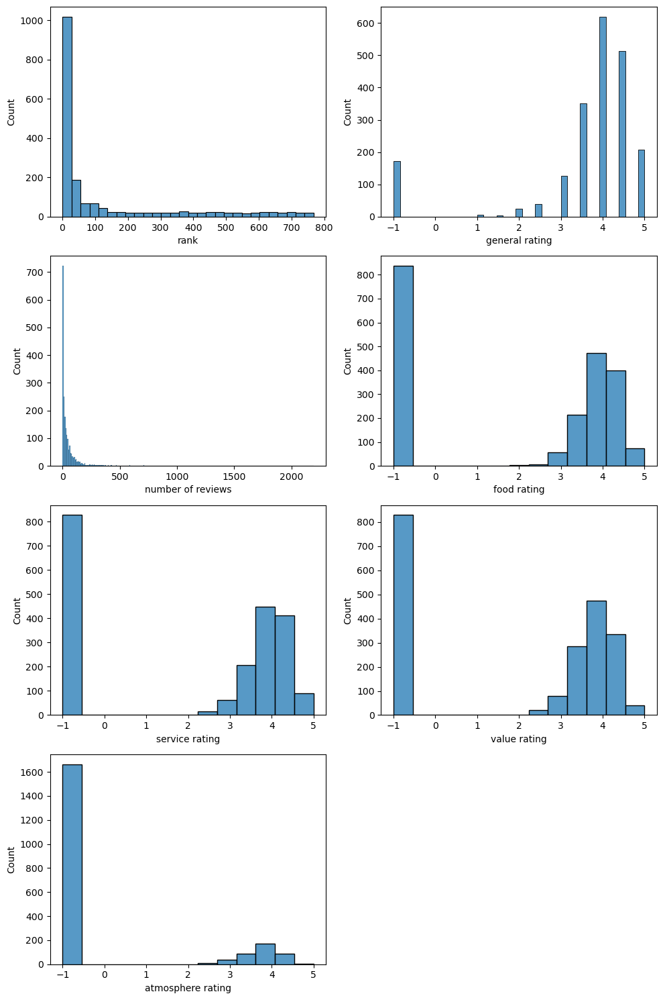

In [1856]:
fig=plt.figure(figsize=(10,15))
for i, col in enumerate(numerical_cols):
    plt.subplot(4,2,i+1)
    sns.histplot(df_train[col])
fig.tight_layout()
plt.show()

what we can see from these distributions is:
* most restaurants have a low rank (lower is better)
* ratings with value -1 mean that they are missing data, there is a lot of missing data visible
* food rating, general rating , value rating and service rating seem to have the same distribution. Maybe they give us the same information and are redundant.

let's take a closer look at number of reviews

## number of reviews

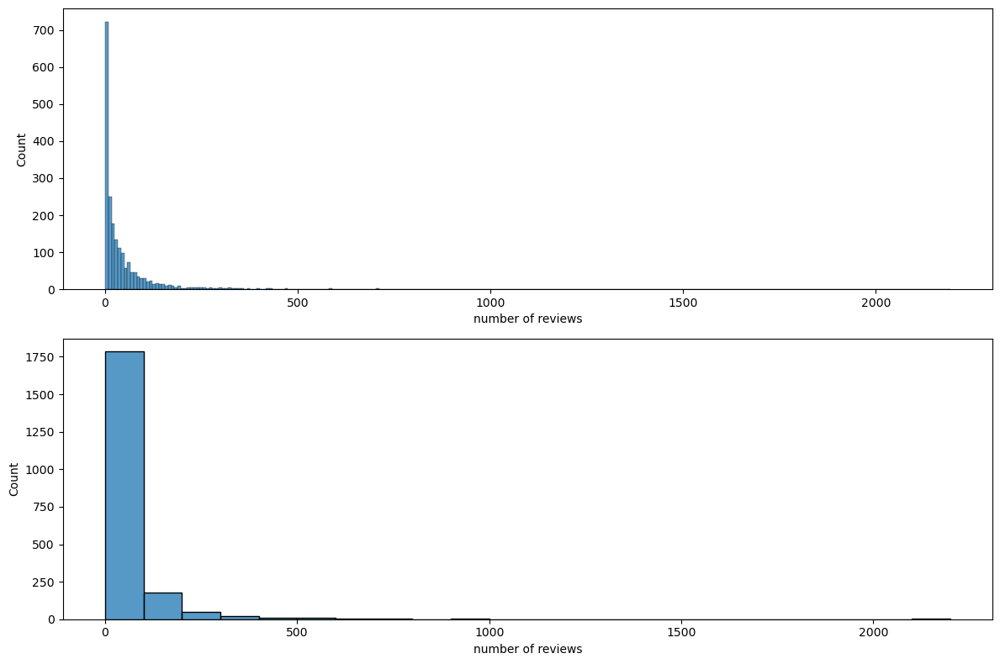

In [1857]:
fig=plt.figure(figsize=(12,8))
plt.subplot(2,1,1)
sns.histplot(df_train["number of reviews"])
plt.subplot(2,1,2)
sns.histplot(df_train["number of reviews"],binwidth=100)
fig.tight_layout()
plt.show()


In [1858]:
print(df_train["number of reviews"].value_counts().sort_index())
zeros=df_train["number of reviews"].isna().sum()
print(f"number of missing values is {zeros}")

0.0       173
1.0       119
2.0       101
3.0        77
4.0        67
         ... 
981.0       1
1484.0      1
1906.0      1
2140.0      1
2193.0      1
Name: number of reviews, Length: 264, dtype: int64
number of missing values is 0


There are a lot of restaurants with 0 reviews and no missing values. How many exactly?

In [1859]:
perc_no_review=df_train["number of reviews"].value_counts()[0]/len(df_train)
print(f"{perc_no_review*100:.2f}% of the restaurants have no reviews!")


8.38% of the restaurants have no reviews!


We decide a treshhold for restaurants with low reviews = 4. So restaurants with 3 or less reviews we consider "hidden treasures"

In [1860]:
perc_hidden=df_train["number of reviews"].value_counts()[0:3].sum()/len(df_train)
print(f"percentage of hidden treasures: {perc_hidden*100:.2f}%")

percentage of hidden treasures: 22.77%


are they really hidden treasures?
* what are the ratings of these hidden treasures? maybe they don't have many reviews bacause people don't eat there because the food is bad or maybe because of the location.
* is there a correlation between the location of a restaurant and the fact if its a hidden treasure or not? maybe there are clusters? maybe big cities don't have these "hidden treasures"

we will come back to this later, first we can start by extracting the city

In [1861]:
df_train['city'] = df_train["address"].str.split(', ').str[-1].str.split(" ").str[0]

We wrote a script to get the coordinates for each restaurant in our dataset. That script will be included with our submission (see getCoordinated.ipynb) notebook. We saved the locations in a csv file with a format: (restaurantid,latitude,longitude)

## Hidden treasures
lets look at these hidden treasures in more detail (remember, hidden treasures are restaurants that have less than 4 ratings)

In [1862]:
hidden_treasures=df_train[df_train["number of reviews"]<=3]
hidden_treasures.replace(-1,np.nan).isna().sum()

rank                   174
restaurant name          0
general rating         173
number of reviews        0
tags                   110
address                  0
phone number            81
website url            150
menu url               424
timetable                0
email address          264
travelers choice         0
michelin                 0
food rating            470
service rating         470
value rating           470
atmosphere rating      470
description            356
dutch description      410
price range              0
cuisines               120
special diets          469
meals                  259
restaurant features    415
id                       0
city                     0
dtype: int64

In [1863]:
len(hidden_treasures)

470

we can see that all of the hidden treasures have no food/service/value-rating!
Also, a lot of them don't have a rank.

let's plot some graphs to see if we can get some more insights

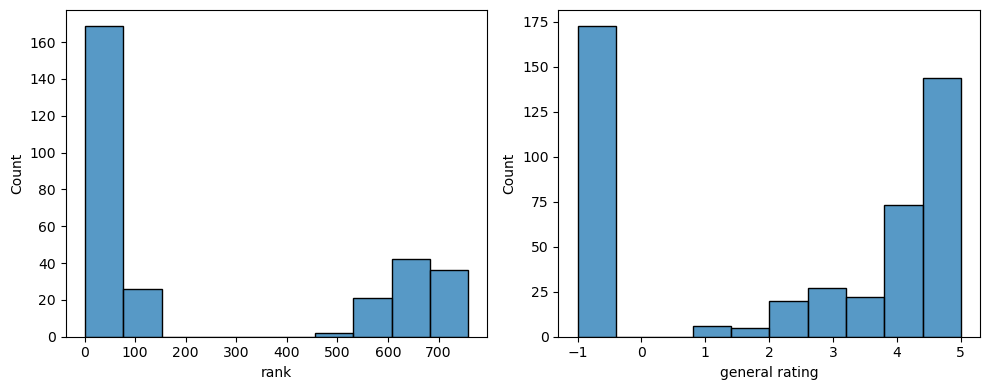

In [1864]:
# cheap_restaurants_with_rating=cheap_restaurants.replace(-1,np.nan).dropna()
fig=plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
sns.histplot(hidden_treasures["rank"])
plt.subplot(1,2,2)
sns.histplot(hidden_treasures["general rating"])
fig.tight_layout()
plt.show()

very interesting to see that there is a clear seperation! we have hidden treasures with ranks < 200 and with ranks >400. but no in between


maybe we can find out why by looking at their ratings

In [1865]:
hidden_treasures_low_rank=hidden_treasures[hidden_treasures["rank"]<200]
hidden_treasures_high_rank=hidden_treasures[hidden_treasures["rank"]>400]
hidden_treasures_no_rank=hidden_treasures[hidden_treasures["rank"].isna()]
print(f"low: {len(hidden_treasures_low_rank)} high: {len(hidden_treasures_high_rank)} no={len(hidden_treasures_no_rank)}")
print("remember, lower rank is better!")

low: 195 high: 101 no=174
remember, lower rank is better!


let's look in detail at the hidden treasures with no ranking information

In [1866]:
import plotly.express as px
#pip install --upgrade nbformat

px.imshow(hidden_treasures_no_rank.replace(-1,np.nan).isna(),title="Null Heatmap")


My god! they have no numerical information available at all
(╯°□°）╯︵ ┻━┻

<AxesSubplot:xlabel='general rating', ylabel='Count'>

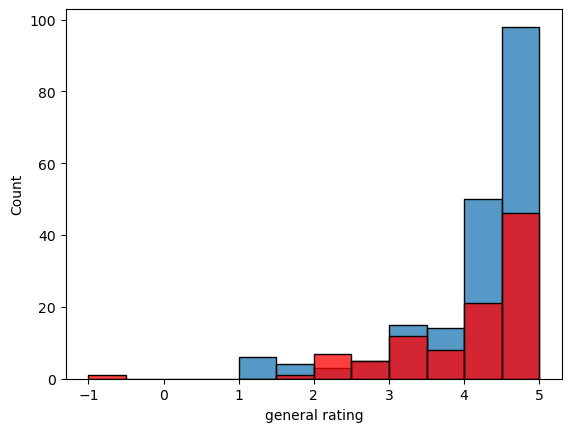

In [1867]:
# hidden_treasures_low_rank["general rating"].value_counts().plot.bar()
# hidden_treasures_high_rank["general rating"].value_counts().plot.bar()
sns.histplot(binwidth=0.5,
            x="general rating",
            data=hidden_treasures_low_rank,
            stat="count",legend=True)
sns.histplot(binwidth=0.5,
            x="general rating",
            data=hidden_treasures_high_rank,
            color="red",
            stat="count",legend=True)

In [1868]:
print(hidden_treasures_low_rank["general rating"].describe())
hidden_treasures_high_rank["general rating"].describe()


count    195.000000
mean       4.076923
std        0.985320
min        1.000000
25%        4.000000
50%        4.500000
75%        5.000000
max        5.000000
Name: general rating, dtype: float64


count    101.000000
mean       3.950495
std        1.101147
min       -1.000000
25%        3.000000
50%        4.000000
75%        5.000000
max        5.000000
Name: general rating, dtype: float64

on average there is not much difference in general rating between the high ranking and the low ranking hidden treasures, a lower ranking hidden treasure has on average a rating that's a little bit better than a high ranking hidden treasure

let's try to plot them on the map to see why they might have so few reviews

In [1869]:
coords=pd.read_csv("coordinaten2.csv").replace(0,np.nan)
hidden_treasures_low_rank=hidden_treasures_low_rank.merge(coords,on="id")
hidden_treasures_high_rank=hidden_treasures_high_rank.merge(coords,on="id")
hidden_treasures_no_rank=hidden_treasures_no_rank.merge(coords,on="id")

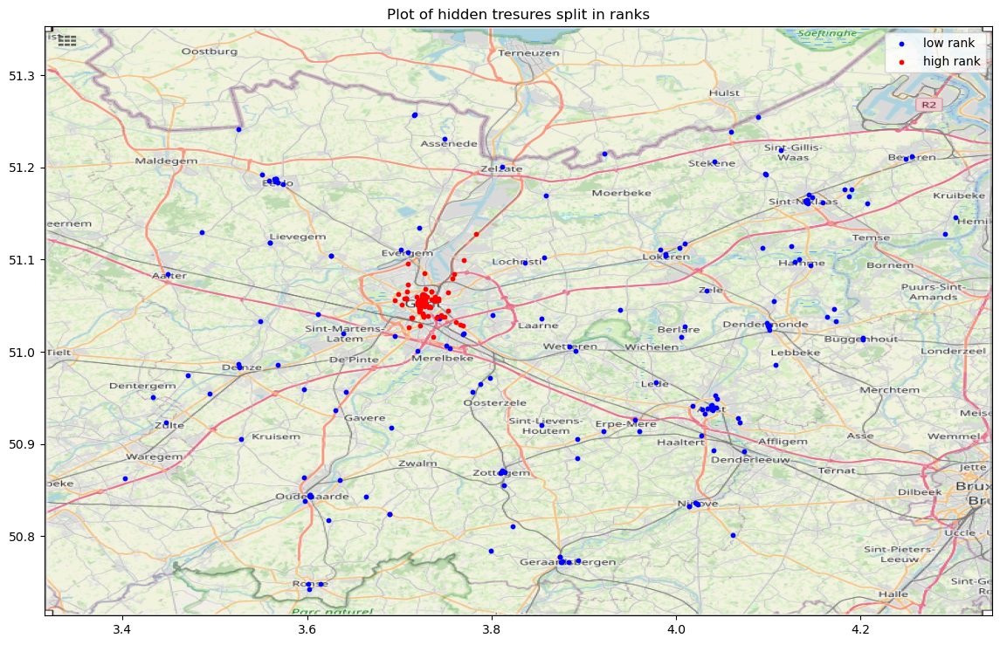

In [1870]:
Bbox = (3.3151,4.3423,50.7139,51.3529)
map = plt.imread("east_flanders.png")

figure, ax = plt.subplots(figsize = (14,16))

ax.scatter(hidden_treasures_low_rank.longitude, hidden_treasures_low_rank.latitude, zorder=1, alpha= 1, c='b',s=10)
ax.scatter(hidden_treasures_high_rank.longitude, hidden_treasures_high_rank.latitude, zorder=1, alpha= 1, c='r',s=10,)

ax.set_title('Plot of hidden tresures split in ranks')
ax.set_xlim(Bbox[0],Bbox[1])
ax.set_ylim(Bbox[2],Bbox[3])
ax.legend(["low rank","high rank","no rank"])
ax.imshow(map, zorder=0, extent=Bbox, aspect='equal')

We can clearly see that the hidden treasures with high ranks are spread out over East-Flanders. If I find a restaurant with a low amount of reviews (hidden treasure) and it has a high rank, then the propability is very high that it is located in or near Ghent.


But that still didn't anwser our question, why do these restaurants have low reviews? And is the location the only factor that influences their ranking?

We were curious about how this ranking system works so we looked up some stuff online [The Secret to Improving Your Tripadvisor Ranking](https://www.checkfront.com/blog/improve-your-tripadvisor-ranking-with-this-one-simple-tip/#:~:text=Tripadvisor%27s%20ranking%20algorithm%20looks%20at,consistency%20of%20incoming%20positive%20reviews.)

here we found that your ranking as based on:
* the quantity of your reviews
* the recency of your reviews
* the quality of your reviews

so for these hidden treasures we already know, the quantity of our reviews is low. So the most obvious thing to look at next was if there was a big difference in their review quality.

In [1871]:
reviews=pd.read_csv("./tripadvisor_dataset/reviews.csv")
reviews.head(2)

,id,reviewer name,title,date,rating,review
0,13969825,bertd818,supper snelle en lekkere lunch,"September 26, 2022",5.0,"supper lekker gegeten tijdens de middag, als w..."
1,13969825,593laetitiad,Un délicieux repas aux saveurs de la Thaïlande,"September 24, 2022",5.0,Un menu lunch très bien équilibré aux niveaux ...


let's extract the year from these reviews and then join them together with the other dataframes

In [1872]:
reviews["review_year"]=reviews.date.str.split(" ").str[-1].astype(int)

In [1873]:
hidden_treasures_low_rank=hidden_treasures_low_rank.merge(reviews,on="id")
hidden_treasures_high_rank=hidden_treasures_high_rank.merge(reviews,on="id")


<AxesSubplot:xlabel='rating', ylabel='Count'>

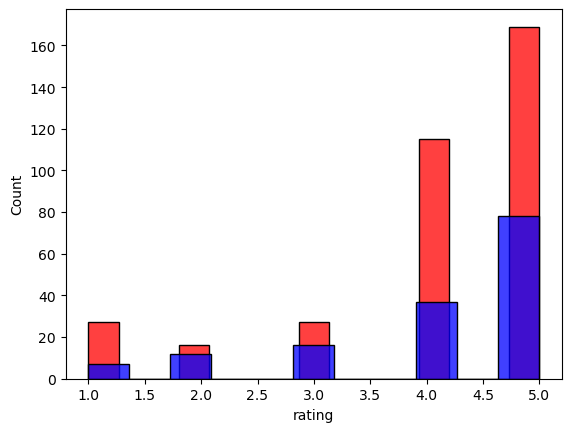

In [1874]:
sns.histplot(hidden_treasures_low_rank.rating,color="red")
sns.histplot(hidden_treasures_high_rank.rating,color="blue")

In [1875]:
print(hidden_treasures_low_rank.rating.mean())
print(hidden_treasures_high_rank.rating.mean())

4.081920903954802
4.113333333333333


I don't really see a difference between the review-ratings, so the difference in their ranks must be caused by something else. Let's dig a little bit deeper

2020.0
2019.1333333333334


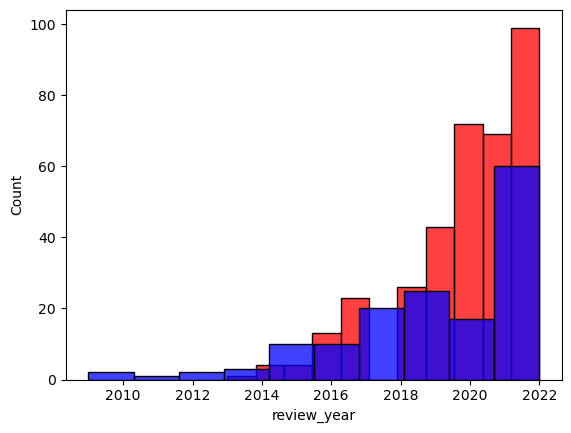

In [1876]:
sns.histplot(hidden_treasures_low_rank["review_year"],color="red")
sns.histplot(hidden_treasures_high_rank["review_year"],color="blue")
print(hidden_treasures_low_rank["review_year"].mean())
print(hidden_treasures_high_rank["review_year"].mean())

I officially give up. I admit my defeat 😢, I can't seem to find why these restaurants have so little reviews. I did find out that in these hidden treasures we can seperate 2 groups, those with a high rank, those with a low rank (and those with no ranking information). We also found out that one of the causes of this ranking difference is the location. 

If your restaurant is located in a big city and you have not many reviews then you're actually performing worse than a restaurant that has the same amount of reviews but is located in a random neighborhood. That might be the cause of the ranking difference. So atleast we did find out this interesting fact from all of these plots :) 

So if we look back at [The Secret to Improving Your Tripadvisor Ranking](https://www.checkfront.com/blog/improve-your-tripadvisor-ranking-with-this-one-simple-tip/#:~:text=Tripadvisor%27s%20ranking%20algorithm%20looks%20at,consistency%20of%20incoming%20positive%20reviews.). Through our data analysis we discovered that this is not completely true, it also depends on your location.

## Price Range
now we can also look at the price range

In [1877]:
df_train["price range"]

385                €29 - €37
745     No pricing available
1681                €5 - €20
2003    No pricing available
431                  €2 - €7
                ...         
26      No pricing available
706     No pricing available
321                €10 - €18
1599               €11 - €26
1033                €9 - €27
Name: price range, Length: 2064, dtype: object

we can split this up into upper_price and lowr_price if it's available

In [1878]:
temp=df_train["price range"].str.replace("No pricing available","nan - nan").str.replace("€","").str.split("-",expand=True).rename(columns={0:"lower price",1:"upper price"})
df_train["lower_price"]=temp["lower price"].astype(float)
df_train["upper_price"]=temp["upper price"].astype(float)


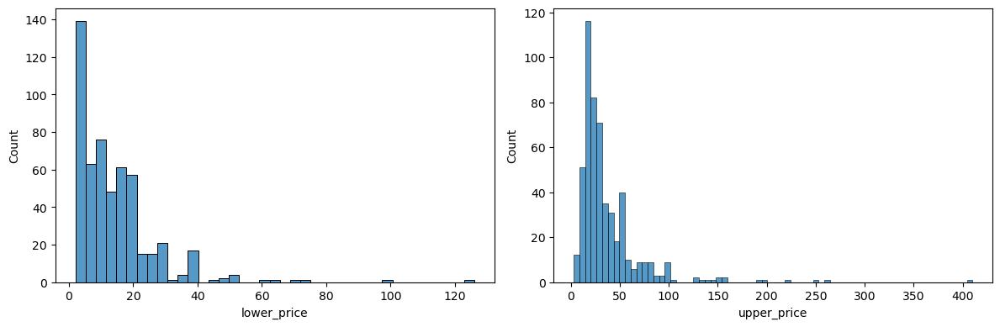

In [1879]:
fig=plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
sns.histplot(df_train["lower_price"])
plt.subplot(1,2,2)
sns.histplot(df_train["upper_price"])
fig.tight_layout()
plt.show()


as we can see there are restaureants who have minimum prices of €100 and upper prices of more than €400, lets check if that's not a typo

In [1880]:
high_upper=df_train[df_train["upper_price"]>150]
high_upper[["restaurant name","rank","general rating","number of reviews","michelin","food rating","service rating","value rating","atmosphere rating","lower_price", "upper_price","meals",'tags']]

,restaurant name,rank,general rating,number of reviews,michelin,food rating,service rating,value rating,atmosphere rating,lower_price,upper_price,meals,tags
22,Portobelfino,2.0,4.5,400.0,False,4.5,4.5,4.5,4.5,100.0,250.0,"Lunch, Dinner, Late Night",$$ - $$$|French|Belgian|International
737,Restaurant Jan Van den Bon,305.0,3.5,112.0,True,4.0,3.5,3.0,3.0,73.0,220.0,"Lunch, Dinner",$$$$|French|Belgian|European
272,Amatsu,141.0,4.0,149.0,True,4.5,4.5,4.0,4.0,39.0,157.0,"Dinner, Late Night",$$ - $$$|Japanese|Seafood|Sushi
533,Ter schroeven,5.0,4.5,61.0,False,4.5,4.5,4.5,4.5,71.0,190.0,"Lunch, Dinner, Late Night",$$ - $$$|French|Belgian|Seafood
14,Hof van Cleve,1.0,5.0,472.0,True,5.0,5.0,4.5,4.5,126.0,260.0,"Lunch, Dinner, Late Night",$$$$|Belgian|European|Vegetarian Friendly
2195,Divan Palace,713.0,3.0,9.0,False,3.5,3.5,4.0,-1.0,2.0,410.0,"Breakfast, Lunch, Dinner",$$ - $$$|American|European|Asian
2158,Keysershof,2.0,3.0,97.0,False,3.5,3.5,3.0,3.5,39.0,158.0,"Lunch, Dinner",$$ - $$$|Belgian|Dutch|European
30,Gillis,19.0,4.5,428.0,False,4.5,4.5,4.0,4.5,60.0,200.0,Dinner,$$ - $$$|Steakhouse|Belgian|Barbecue


from the restaurants who have high upper prices:
* there is 1 with a michelin star
* on average they have a general rating >=4
* the lower price is exteremely low! maybe because they include drinks in their lower price
* we conclude that rank is only partly affected by rating. The restaurant Amatsu has a michelin star, which means the food, service,... is excellent but it's rank is only 272. Average people don't go to michelin starred restaurant very often so that is maybe the cause of the lower rank.
* the data is a little messed up. iGent has an upper price of €200. as students of Ghent University we can testify that that is incorrect

from this we can conclude that we have to look at these price ranges with a grain of salt. because not all of them are correct/sometimes drinks are included, so maybe it's better to look at the $ in the tags attribute.


<span style="color:red">notice because of the shuffeling of our data before the train, test-split the examples of restaurants mention in our conclusions might not be visible in the dataframe </span>

## cheap_restaurants

let's analyze the cheap restaurants, we defined cheap as upper_price<=30

In [1881]:
cheap_restaurants=df_train[df_train["upper_price"]<=30]
cheap_restaurants=cheap_restaurants[["restaurant name","rank","general rating","number of reviews","michelin","food rating","service rating","value rating","atmosphere rating","lower_price", "upper_price","meals","city","id"]]

<__array_function__ internals>:180: RuntimeWarning:

Converting input from bool to <class 'numpy.uint8'> for compatibility.



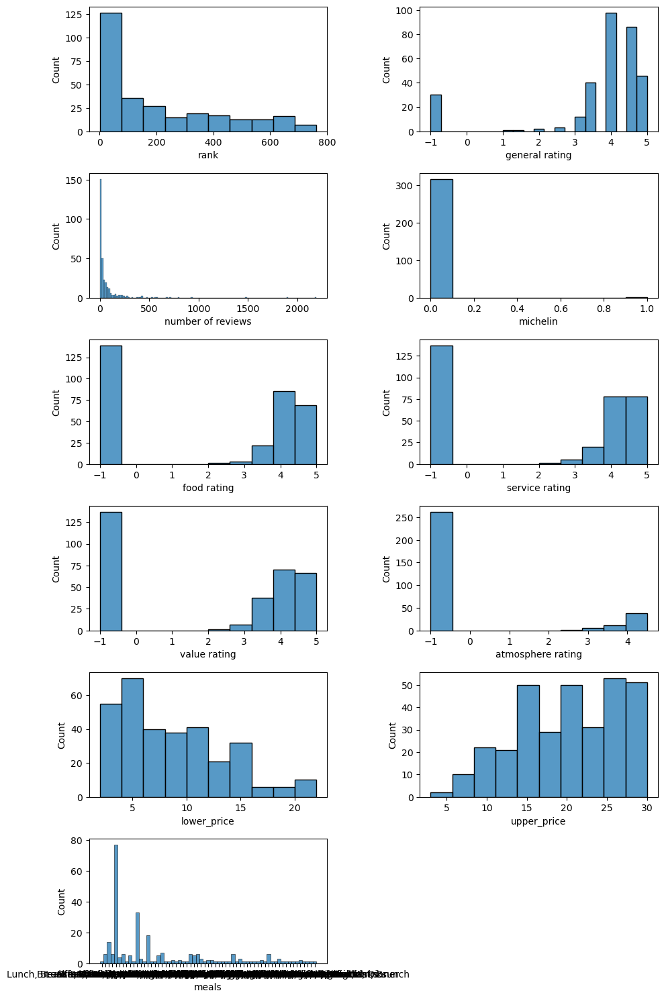

In [1882]:
fig=plt.figure(figsize=(10,15))
for i, col in enumerate(["rank","general rating","number of reviews","michelin","food rating","service rating","value rating","atmosphere rating","lower_price", "upper_price","meals"]):
    plt.subplot(6,2,i+1)
    sns.histplot(cheap_restaurants[col])
fig.tight_layout()
plt.show()

* we can see that a lot of cheap restaurants have a low rank (which is good)
* we can see a very clear peak in the meals chart, lets take a closer look


In [1883]:
cheap_restaurants.meals.value_counts()
meals=cheap_restaurants.meals.str.split(",",expand=True)
pd.concat((meals[0],meals[1],meals[2],meals[3],meals[4])).str.strip().value_counts()

Lunch         226
Dinner        226
Drinks        113
Breakfast      51
Brunch         51
Late Night     22
dtype: int64

From all the cheap restaurants, most types of meals offered is Lunch, which is expected. 
But it's also interesting to note most of the cheap restaurants also serve Dinner and Drinks.


A lot of the ratings are -1, lets look at the cheap restaurants without these contaminations

<__array_function__ internals>:180: RuntimeWarning:

Converting input from bool to <class 'numpy.uint8'> for compatibility.



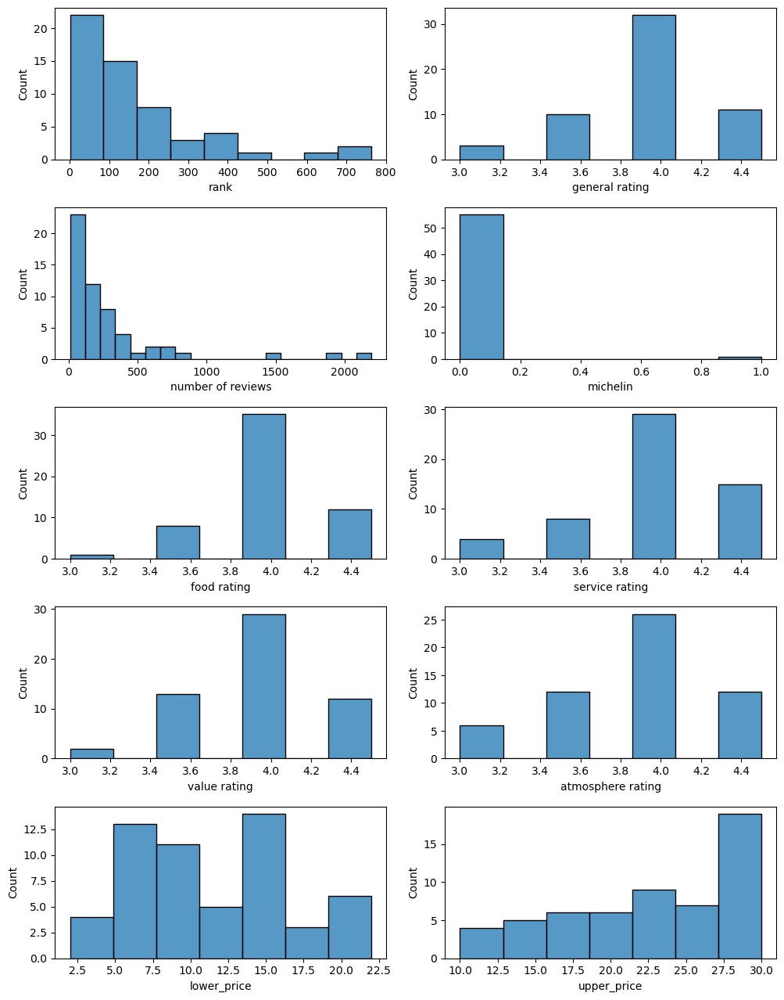

In [1884]:
cheap_restaurants_with_rating=cheap_restaurants.replace(-1,np.nan).dropna()
fig=plt.figure(figsize=(10,15))
for i, col in enumerate(["rank","general rating","number of reviews","michelin","food rating","service rating","value rating","atmosphere rating","lower_price", "upper_price"]):
    plt.subplot(6,2,i+1)
    sns.histplot(cheap_restaurants_with_rating[col])
fig.tight_layout()
plt.show()

* general-, food-,service- and value rating have the same distribution. from this we suspect that these values have high correlations. If one of my ratings is good, the others are very close to it. we could then drop the reduntant features.

* some of the cheap restaurants have more than a thousand reviews! I have to take a closer look at those. Maybe I can find their secret


In [1885]:
cheap_restaurants[cheap_restaurants["number of reviews"]>1000]

,restaurant name,rank,general rating,number of reviews,michelin,food rating,service rating,value rating,atmosphere rating,lower_price,upper_price,meals,city,id
98,Restaurant De Graslei,58.0,4.0,1484.0,False,4.0,4.0,4.0,4.5,18.0,30.0,"Lunch, Dinner, Brunch",Ghent,1058490
148,Amadeus Ghent 1,84.0,4.0,1906.0,False,4.0,4.0,4.0,4.0,12.0,20.0,"Lunch, Dinner, Late Night",Ghent,740683
27,Du Progres,16.0,4.5,2193.0,False,4.5,4.5,4.5,4.0,22.0,29.0,"Lunch, Dinner, Brunch, Late Night",Ghent,814598


All of these are located in ghent! that explains the high amount of reviews. But the others, are they not located in ghent? Let's check

In [1886]:
cheap_restaurants=cheap_restaurants.merge(coords,on="id")

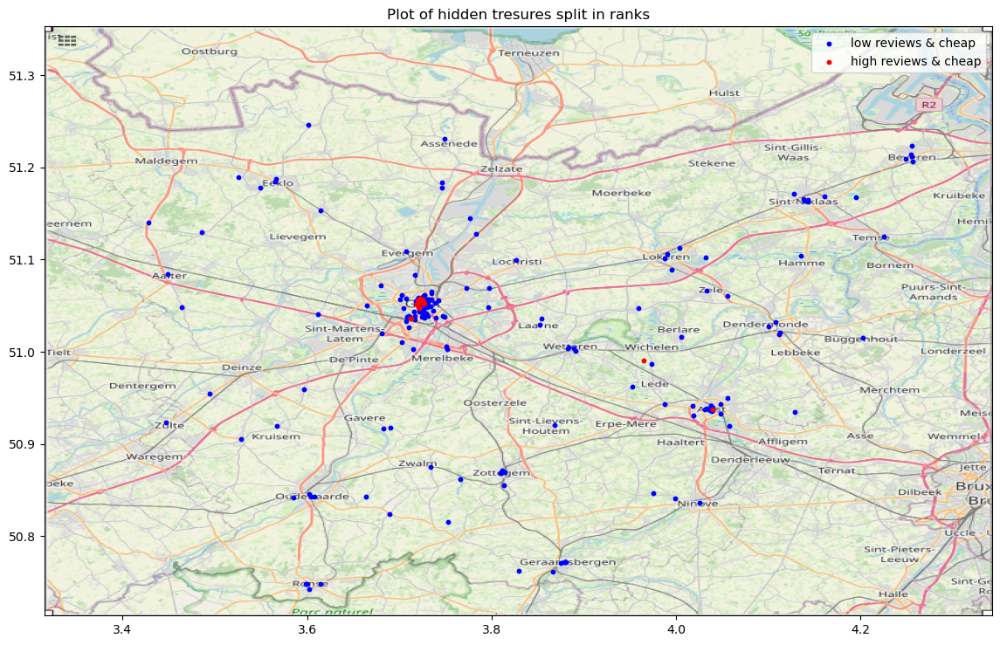

In [1887]:
Bbox = (3.3151,4.3423,50.7139,51.3529)
map = plt.imread("east_flanders.png")

figure, ax = plt.subplots(figsize = (14,16))
low_reviews=cheap_restaurants[cheap_restaurants["number of reviews"]<200]
high_reviews=cheap_restaurants[cheap_restaurants["number of reviews"]>=200]

ax.scatter(low_reviews.longitude, low_reviews.latitude, zorder=1, alpha= 1, c='b',s=10)
ax.scatter(high_reviews.longitude, high_reviews.latitude, zorder=1, alpha= 1, c='r',s=10,)

ax.set_title('Plot of hidden tresures split in ranks')
ax.set_xlim(Bbox[0],Bbox[1])
ax.set_ylim(Bbox[2],Bbox[3])
ax.legend(["low reviews & cheap","high reviews & cheap"])
ax.imshow(map, zorder=0, extent=Bbox, aspect='equal')

I changed the treshold from 1000 to 200 and still,... almost all of the restaurants with high number of reviews are located in bigger cities like ghent or aalst.

let's see if the $ in the tags attribute is a better proxy for the price range

In [1888]:
first_tag=df_train.tags.str.split("|",expand=True)[0].dropna()
ranges=first_tag[first_tag.str.find("$")!=-1]

In [1889]:
print(f"we have the price ranges of {len(ranges)} restaurants while we had the upper and lower prices of {len(df_train['upper_price'].dropna())} restaurants, this looks promising!")

we have the price ranges of 1557 restaurants while we had the upper and lower prices of 530 restaurants, this looks promising!


In [1890]:
df_train["price_tag"]=ranges

In [1891]:
df_train["price_tag"].value_counts()

$$ - $$$    1223
$            274
$$$$          60
Name: price_tag, dtype: int64

we get 3 types of restaurants: cheap, medium and expensive, let's look at the locations

In [1892]:
df_train=df_train.merge(coords,on="id")


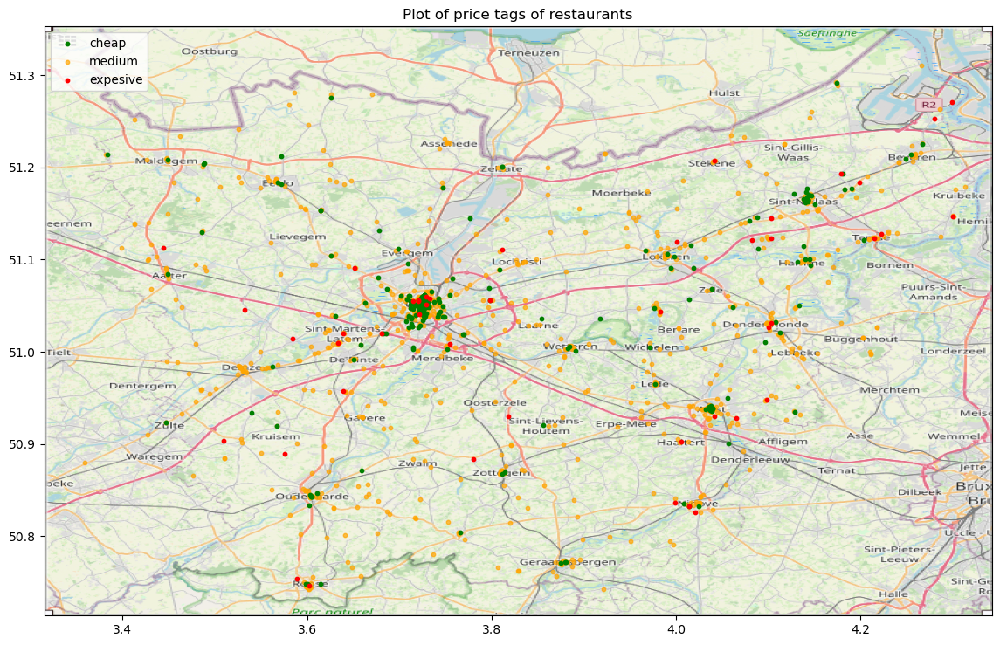

In [1893]:
Bbox = (3.3151,4.3423,50.7139,51.3529)
map = plt.imread("east_flanders.png")

figure, ax = plt.subplots(figsize = (14,16))
# low_reviews=cheap_restaurants[cheap_restaurants["number of reviews"]<200]
cheap=df_train[df_train["price_tag"]=="$"]
medium=df_train[df_train["price_tag"]=="$$ - $$$"]
expensive=df_train[df_train["price_tag"]=="$$$$"]

# ax.scatter(low_reviews.longitude, low_reviews.latitude, zorder=1, alpha= 1, c='b',s=10)
ax.scatter(cheap.longitude, cheap.latitude, zorder=1, alpha= 1, c='green',s=10)
ax.scatter(medium.longitude, medium.latitude, zorder=0.5, alpha= 0.7, c='orange',s=10)
ax.scatter(expensive.longitude, expensive.latitude, zorder=1, alpha= 1, c='red',s=10)

ax.set_title('Plot of price tags of restaurants')
ax.set_xlim(Bbox[0],Bbox[1])
ax.set_ylim(Bbox[2],Bbox[3])
ax.legend(["cheap","medium","expesive"])
ax.imshow(map, zorder=0, extent=Bbox, aspect='equal')

the medium restaurants are scattered all over East-Flanders. Expensive and cheap restaurants are not as widespread but you don't have to drive far if you want to eat at one.

Let's look at the expensive restaurants of ghent in detail

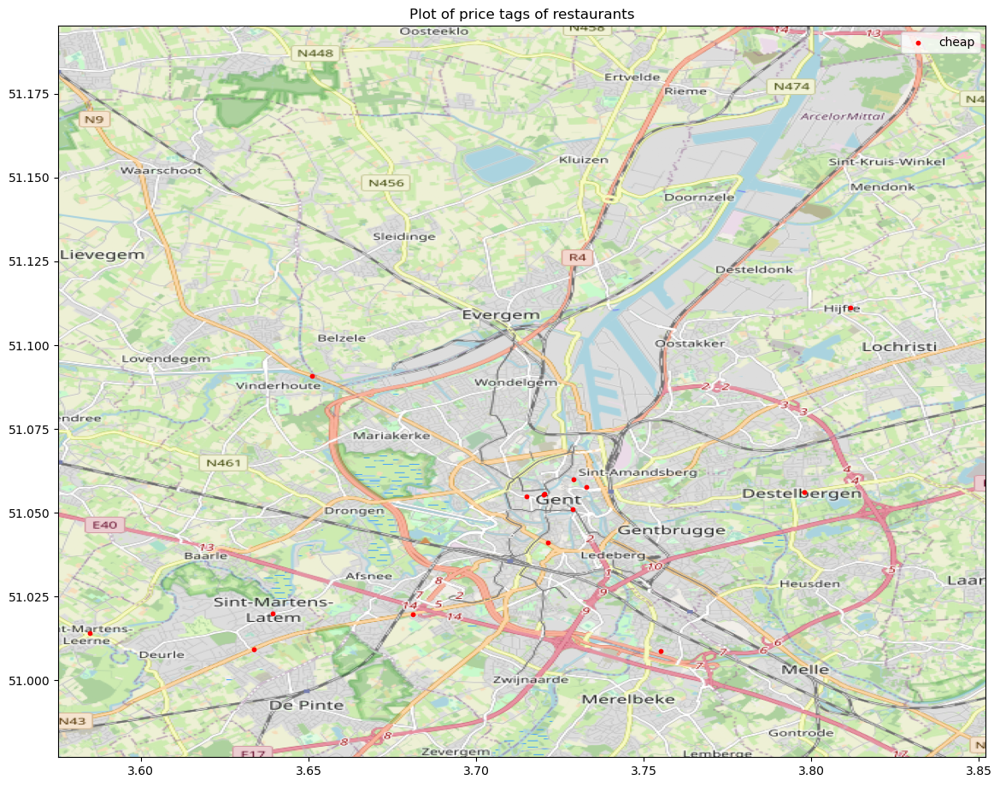

In [1894]:
Bbox = (3.5754,3.8521,50.9770,51.1953)
map = plt.imread("ghent.png")

figure, ax = plt.subplots(figsize = (14,16))
# low_reviews=cheap_restaurants[cheap_restaurants["number of reviews"]<200]
cheap=df_train[df_train["price_tag"]=="$"]
medium=df_train[df_train["price_tag"]=="$$ - $$$"]
expensive=df_train[df_train["price_tag"]=="$$$$"]

# ax.scatter(low_reviews.longitude, low_reviews.latitude, zorder=1, alpha= 1, c='b',s=10)
# ax.scatter(cheap.longitude, cheap.latitude, zorder=1, alpha= 1, c='green',s=10)
# ax.scatter(medium.longitude, medium.latitude, zorder=0.5, alpha= 0.2, c='orange',s=10)
ax.scatter(expensive.longitude, expensive.latitude, zorder=1, alpha= 1, c='r',s=10)

ax.set_title('Plot of price tags of restaurants')
ax.set_xlim(Bbox[0],Bbox[1])
ax.set_ylim(Bbox[2],Bbox[3])
ax.legend(["cheap","medium","expesive"])
ax.imshow(map, zorder=0, extent=Bbox, aspect='equal')

if you zoom in you can see, the 5 expensive restaurants in the centre of ghent are located near the water 

<img src="./zoomed_image_expensive_restaurants.png">

that's something that seems obvious if you read it but still satisfying to see it come out of your data

Kan ik hier nog iets over zeggen?

now that we have these price tags, we don't need the price ranges anymore

In [1895]:
df_train.drop(columns=["upper_price", "lower_price", "price range"], inplace=True)

## general-, food-,service- and value rating

we already know that these attributes have the same distribution, lets see if they are redundant

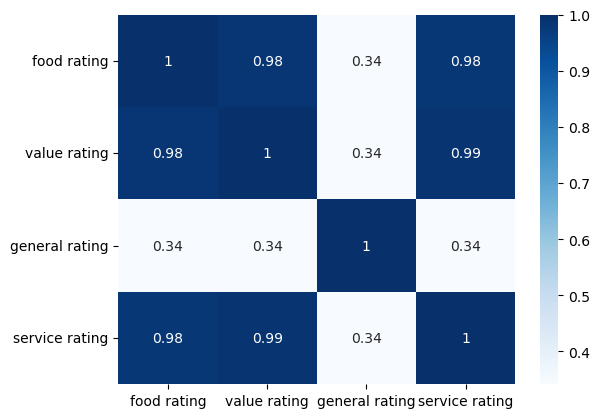

In [1896]:
corr = df_train[["food rating","value rating","general rating","service rating"]].corr()
heatmap = sns.heatmap(corr, annot=True, cmap="Blues")

Okay, we should have done this earlier😅. Food rating, value rating and service rating have a correlation factor of 0.98. which means that if we know 1 of them, the other ratings won't give us any more interesting information so we can safely drop them.

In [1897]:
df_train.drop(columns=["food rating", "service rating"], inplace=True)

In [1898]:
df_train

,rank,restaurant name,general rating,number of reviews,tags,address,phone number,website url,menu url,timetable,email address,travelers choice,michelin,value rating,atmosphere rating,description,dutch description,cuisines,special diets,meals,restaurant features,id,city,price_tag,latitude,longitude
0,181.0,Jour de Fete,4.0,91.0,$$ - $$$|Belgian|European|Vegetarian Friendly,"Gustaaf Carlierllaan 233, Ghent Belgium",+32 9 233 66 45,http://restaurantjourdefete.be/,http://restaurantjourdefete.be/#!pages/weekmen...,True,NaN,False,False,4.5,4.5,NaN,NaN,"Belgian, European","Vegetarian Friendly, Gluten Free Options","Lunch, Dinner","Reservations, Seating, Wheelchair Accessible, ...",866334,Ghent,$$ - $$$,NaN,NaN
1,18.0,Brasserie Bar Boef,4.0,40.0,$$ - $$$|Belgian|European|Vegetarian Friendly,"Vlasmarkt 45, Dendermonde 9200 Belgium",+32 472 50 36 71,http://www.brasseriebarboef.be/,NaN,True,NaN,False,False,4.5,-1.0,NaN,NaN,"Belgian, European",Vegetarian Friendly,"Lunch, Dinner","Reservations, Seating, Table Service",8641014,Dendermonde,$$ - $$$,51.029162,4.098837
2,27.0,Tea-Room Graanmarkt,4.0,13.0,$$ - $$$|Belgian|Dutch|European,"Clement Behnplein 5, Ninove 9400 Belgium",+32 54 33 20 91,http://www.tearoomgraanmarkt.be/,https://www.tearoomgraanmarkt.be/menu,True,lana.hemerijckx@icloud.com,False,False,3.5,-1.0,NaN,NaN,"Belgian, Dutch, European",NaN,"Lunch, Breakfast, Dinner, Brunch, Drinks","Table Service, Takeout, Reservations, Outdoor ...",15007795,Ninove,$$ - $$$,50.836383,4.025715
3,654.0,Frituur,4.0,2.0,NaN,"Zwijnaardsesteenweg 318, Ghent 9000 Belgium",NaN,NaN,NaN,False,pleintje.gent@telenet.be,False,False,-1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,8873848,Ghent,NaN,51.028667,3.722134
4,203.0,Comic Sans,4.5,36.0,$,"Klein Turkije 8, Ghent 9000 Belgium",NaN,https://www.facebook.com/cafecomicsans,NaN,True,jeroen.baert@hotmail.be,False,False,4.5,-1.0,Belgium's first Geek-Bar! Enter a world of com...,NaN,NaN,NaN,Lunch,"Seating, Serves Alcohol, Wheelchair Accessible...",11500597,Ghent,$,51.054423,3.722958
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2059,1.0,Carpe Diem,5.0,172.0,$$ - $$$|French|Belgian|Dutch,"Dorpsstraat 147, Sint-Laureins 9980 Belgium",+32 495 32 87 68,http://www.restaurant-carpediem.be/,http://www.restaurant-carpediem.be/,True,info@restaurant-carpediem.be,True,False,4.5,4.5,"One Of My Favourite Restaurants, Surprised It'...",NaN,"French, Belgian, Dutch, Seafood, European","Vegetarian Friendly, Vegan Options, Gluten Fre...","Lunch, Dinner, Late Night","Reservations, Seating, Highchairs Available, W...",3351157,Sint-Laureins,$$ - $$$,51.241795,3.525078
2060,1.0,Lucifer,4.0,135.0,$$ - $$$|Belgian|Seafood|European,"Hundelgemsesteenweg 1242, Steenberge 9820 Belgium",+32 9 233 91 97,http://www.luciferfondue.be/,NaN,True,NaN,False,False,4.0,4.0,Welcome to Lucifer Fondue and Stonegrill Resta...,NaN,"Belgian, Seafood, European",NaN,"Lunch, Dinner","Reservations, Seating, Highchairs Available, S...",6163280,Steenberge,$$ - $$$,NaN,NaN
2061,153.0,PLUS+,4.5,63.0,$|European|Contemporary|Healthy,"Ajuinlei 14, Ghent 9000 Belgium",+32 486 36 73 93,http://www.plus.gent/,https://cdn.shopify.com/s/files/1/0360/8169/69...,True,info@plus.gent,False,False,4.0,-1.0,The green hotspot in Ghent city where we love ...,Bij PLUS+ houden we van eenvoudige en pure ing...,"European, Contemporary, Healthy","Vegetarian Friendly, Vegan Options, Gluten Fre...","Breakfast, Lunch, Brunch, Drinks","Takeout, Outdoor Seating, Seating, Highchairs ...",10135239,Ghent,$,51.051286,3.720153
2062,26.0,Het Bruggenhuis,3.5,19.0,$$ - $$$|Belgian|Dutch|European,"Majoor van Lierdelaan 50, Geraardsbergen 9500 ...",+32 54 24 48 89,http://www.bruggenhuis.be/,http://www.bruggenhuis.be/menu.php,True,hetbruggenhuis@telenet.be,False,False,3.5,-1.0,Lovely situated café-restaurant near the river...,Zalig gelegen café-restaurant aan de Dender. S...,"Belgian, Dutch, European",Vegetarian Friendly,"Lunch, Dinner","Reservations, Out

## Binning of number of reviews

lets bin the number of reviews for better classification later on

d:\programmas_unif\miniconda\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning:

divide by zero encountered in log



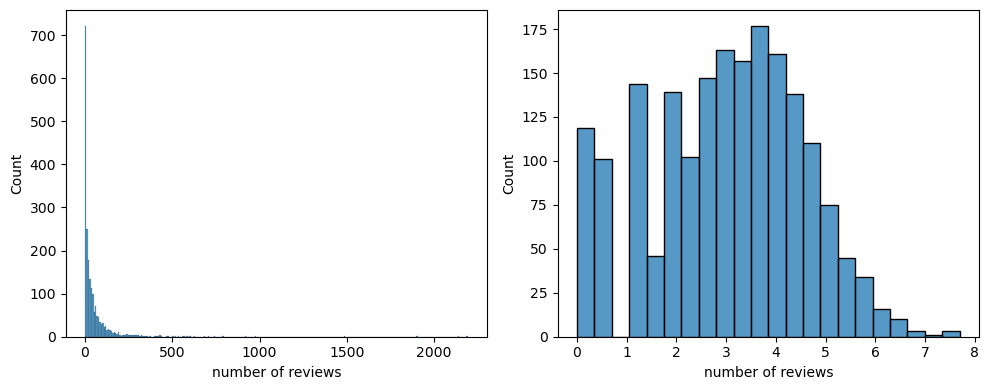

In [1899]:
fig=plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
sns.histplot(df_train["number of reviews"])
plt.subplot(1,2,2)
sns.histplot(np.log(df_train["number of reviews"]))
fig.tight_layout()
plt.show()

The dristribution of our data looks a lot more balanced if we transform it. but there are a lot of restaurants with zero reviews. I'll add a review to them so we don't get the divide by zero error anymore. Later if we are training our model we still need a method to distinguish these restaurants with zero reviews so I'm adding an extra attribute that indicates of the restaurant has zero reviews or not.

In [1900]:
df_train["zero reviews"] = False


In [1901]:
df_train.loc[df_train["number of reviews"]==0,"zero reviews"] = True
df_train.loc[df_train["number of reviews"]==0,"number of reviews"] = 1
df_train["log reviews"]=np.log(df_train["number of reviews"])
df_train.drop(columns=["number of reviews"],inplace=True)

## Missing data

let's see how we can fix our missing data problem

In [1902]:
df_train.replace(-1,np.nan).isna().sum()

rank                    175
restaurant name           0
general rating          173
tags                    162
address                   0
phone number            174
website url             329
menu url               1352
timetable                 0
email address           995
travelers choice          0
michelin                  0
value rating            829
atmosphere rating      1664
description            1649
dutch description      1833
cuisines                257
special diets          1375
meals                   480
restaurant features     626
id                        0
city                      0
price_tag               507
latitude                213
longitude               213
zero reviews              0
log reviews               0
dtype: int64

We can't really drop rows with the missing values because it's a big part of our data that we would waste.
* for the rank we already know that it depends on your reviews and your location so maybe we can look at similar restaurants in the same city with the same number of reviews and the same cuisine
* same voor general rating, value rating,atmosphere rating
* maybe we can get a simple description from the reviews
* we can try to get the missing cuisines from the tags


In [1903]:
def findRank(row):
    #first get all restaurants that have the same city
    #then drop out those that don't have the same amount of reviews
    #then drop out those that don't have the same price range
    #then drop those that have a different quisine
    #then from those that are left, calculate the average rank 
    same_city=df_train[df_train["city"]==row["city"]]
    reviews=row["log reviews"]
    same_review=same_city[same_city["log reviews"].between(reviews,reviews+1,inclusive='left')]
    same_review

In [1904]:
# df_train[df_train["rank"].isna()].apply(findRank, axis=1)

While writing above function I realised, what I'm actually doing is filling in the missing ranks by looking at the restaurants that look the most like it. This reminded me of the K nearest neighbor classifier we used during our lab. But now instead of a classifier we're using a regressor

In [1905]:
rank_finder_input=df_train[df_train["rank"].isna()==False].drop(columns=["restaurant name","timetable","address","tags","phone number","website url","menu url","email address","description","dutch description","id","latitude","longitude"])
rank_finder_input_train,rank_finder_input_test=train_test_split(rank_finder_input,test_size=0.1)

In [1906]:
#multi hot encoding of the meals, restaurant features ,cuisines and diets
from sklearn.preprocessing import MultiLabelBinarizer

mlbs=[]
columns=["meals","restaurant features","cuisines","special diets"]
mh_encodings=[]
for col in columns:
    mlb= MultiLabelBinarizer()
    mlbs.append(mlb)
    X=rank_finder_input_train[col].str.replace(" ","").str.split(",").fillna("X").to_list()
    #I want a list of sets that i can then pass to the MultiLabelBinarizer
    lijst=[set(i) for i in X]
    mh_encodings.append(mlb.fit_transform(lijst))


In [1907]:
for i in mh_encodings:
    print(i.shape)

(1700, 7)
(1700, 40)
(1700, 86)
(1700, 5)


one hot encode the city

In [1908]:
from sklearn.preprocessing import OneHotEncoder
enc=OneHotEncoder(sparse=False,handle_unknown="infrequent_if_exist")
enc.fit(np.array(rank_finder_input_train["city"]).reshape(-1,1))
oh_cities=enc.transform(np.array(rank_finder_input_train["city"]).reshape(-1,1))
# df['city_OHE_encoded']=d
oh_cities

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [1909]:
rank_finder_input_train.drop(columns=["cuisines","special diets","meals","restaurant features","city"],inplace=True)
rank_finder_input_train

,rank,general rating,travelers choice,michelin,value rating,atmosphere rating,price_tag,zero reviews,log reviews
117,96.0,5.0,False,False,-1.0,-1.0,NaN,False,0.693147
277,5.0,4.0,False,False,4.0,-1.0,$$ - $$$,False,3.218876
1468,19.0,4.5,False,False,-1.0,-1.0,NaN,False,1.386294
397,4.0,4.5,False,True,4.5,-1.0,$$ - $$$,False,2.302585
991,2.0,4.5,False,False,4.5,4.5,$$ - $$$,False,4.867534
...,...,...,...,...,...,...,...,...,...
1917,385.0,4.5,False,False,-1.0,-1.0,$$ - $$$,False,2.397895
435,102.0,4.5,False,False,4.0,4.0,$$ - $$$,False,4.859812
12,1.0,4.0,False,False,4.0,-1.0,$$ - $$$,False,4.007333
858,4.0,4.5,False,True,4.0,4.0,$$$$,False,4.875197


ordinal encode price tag

In [1910]:
rank_finder_input_train.loc[rank_finder_input_train.price_tag=="$","price_tag"]=1
rank_finder_input_train.loc[rank_finder_input_train.price_tag=="$$ - $$$","price_tag"]=2
rank_finder_input_train.loc[rank_finder_input_train.price_tag=="$$$$","price_tag"]=3
rank_finder_input_train["price_tag"]=rank_finder_input_train.price_tag.fillna(0)

In [1911]:
y_train=rank_finder_input_train["rank"]
rank_finder_input_train.drop(columns=["rank"],inplace=True)

In [1912]:
X=np.concatenate((oh_cities,mh_encodings[0],mh_encodings[1],mh_encodings[2],mh_encodings[3],rank_finder_input_train),axis=1)

In [1913]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsRegressor
params={"n_neighbors":[4,5,6,10,15,17,19,23,30,35,40],"weights":['uniform','distance'],"leaf_size":[10,20,30,40,50]}
rank_finder = RandomizedSearchCV(KNeighborsRegressor(), params, random_state=0)
rank_finder.fit(X, y_train)
rank_finder.best_params_

{'weights': 'distance', 'n_neighbors': 10, 'leaf_size': 10}

now test the performance


In [1914]:
columns=["meals","restaurant features","cuisines","special diets"]
mh_encodings=[]
for i,col in enumerate(columns):
    mlb= mlbs[i]
    X=rank_finder_input_test[col].str.replace(" ","").str.split(",").fillna("X").to_list()
    #I want a list of sets that i can then pass to the MultiLabelBinarizer
    lijst=[set(i) for i in X]
    mh_encodings.append(mlb.transform(lijst))
oh_cities=enc.transform(np.array(rank_finder_input_test["city"]).reshape(-1,1))
rank_finder_input_test.drop(columns=["cuisines","special diets","meals","restaurant features","city"],inplace=True)
rank_finder_input_test.loc[rank_finder_input_test.price_tag=="$","price_tag"]=1
rank_finder_input_test.loc[rank_finder_input_test.price_tag=="$$ - $$$","price_tag"]=2
rank_finder_input_test.loc[rank_finder_input_test.price_tag=="$$$$","price_tag"]=3
rank_finder_input_test["price_tag"]=rank_finder_input_test.price_tag.fillna(0)


d:\programmas_unif\miniconda\lib\site-packages\sklearn\preprocessing\_label.py:878: UserWarning:

unknown class(es) ['Catalan', 'Hawaiian'] will be ignored



In [1915]:
rank_finder_input_test

,rank,general rating,travelers choice,michelin,value rating,atmosphere rating,price_tag,zero reviews,log reviews
966,563.0,4.0,False,False,-1.0,-1.0,0,False,2.079442
547,2.0,4.5,False,False,4.0,-1.0,2,False,4.234107
196,240.0,4.5,False,False,4.5,-1.0,2,False,3.970292
762,614.0,3.0,False,True,3.0,3.5,2,False,5.758902
293,3.0,3.5,False,False,3.5,-1.0,2,False,2.833213
...,...,...,...,...,...,...,...,...,...
1936,597.0,3.5,False,False,4.0,-1.0,2,False,1.791759
1212,32.0,2.5,False,False,2.5,-1.0,2,False,4.543295
308,129.0,2.5,False,False,-1.0,-1.0,0,False,1.945910
1083,617.0,5.0,False,False,-1.0,-1.0,0,False,0.000000


In [1916]:
y_test=rank_finder_input_test["rank"]
rank_finder_input_test.drop(columns=["rank"],inplace=True)
X=np.concatenate((oh_cities,mh_encodings[0],mh_encodings[1],mh_encodings[2],mh_encodings[3],rank_finder_input_test),axis=1)
rank_finder.score(X,y_test)

0.6043653908010338

and now, finally it's time to fill in our missing ranks

In [1917]:
no_rank=df_train[df_train["rank"].isna()].drop(columns=["restaurant name","timetable","address","tags","phone number","website url","menu url","email address","description","dutch description","id","latitude","longitude"])

In [1918]:
columns=["meals","restaurant features","cuisines","special diets"]
mh_encodings=[]
for i,col in enumerate(columns):
    mlb= mlbs[i]
    X=no_rank[col].str.replace(" ","").str.split(",").fillna("X").to_list()
    #I want a list of sets that i can then pass to the MultiLabelBinarizer
    lijst=[set(i) for i in X]
    mh_encodings.append(mlb.transform(lijst))

d:\programmas_unif\miniconda\lib\site-packages\sklearn\preprocessing\_label.py:878: UserWarning:

unknown class(es) ['Afghan', 'Assyrian', 'CentralAsian', 'Hawaiian'] will be ignored



In [1919]:
oh_cities=enc.transform(np.array(no_rank["city"]).reshape(-1,1))

In [1920]:
no_rank.drop(columns=["rank","cuisines","special diets","meals","restaurant features","city"],inplace=True)

In [1921]:
no_rank.loc[no_rank.price_tag=="$","price_tag"]=1
no_rank.loc[no_rank.price_tag=="$$ - $$$","price_tag"]=2
no_rank.loc[no_rank.price_tag=="$$$$","price_tag"]=3
no_rank["price_tag"]=no_rank.price_tag.fillna(0)

In [1922]:
X=np.concatenate((oh_cities,mh_encodings[0],mh_encodings[1],mh_encodings[2],mh_encodings[3],no_rank),axis=1)
predicted_ranks=rank_finder.predict(X)

In [1923]:
predicted_ranks

array([240.35878199, 310.66314244, 173.15846857, 302.05138036,
       174.84612048, 309.16744315, 233.37246415, 305.05120127,
       248.09373611, 174.84612048, 310.66314244, 173.73743195,
       313.20438094, 152.29738789, 233.37246415, 233.8708494 ,
       315.08747684, 246.43673162, 167.11324962, 311.3700982 ,
       228.7449927 , 233.37246415, 318.37217881, 326.48783749,
       311.70590633, 312.17754235, 377.09883766, 313.43841941,
       316.25367396, 253.07267513, 313.20438094, 247.24943453,
       308.19557891, 328.59388345, 244.18366876, 241.91828084,
       227.5534082 , 229.35726519, 227.58108418, 233.37246415,
       248.25907048, 310.66314244, 314.99211988, 328.59388345,
       245.04366463, 248.25907048, 310.14017671, 264.05335987,
       244.34464372, 253.11211162, 179.61897578, 315.45300243,
       231.63583086, 169.53112466, 250.38265962, 253.07267513,
       249.08637179, 186.35854633, 310.46453418, 173.76483102,
       233.37246415, 178.26483605, 247.68946161, 328.59

In [1924]:
df_train.loc[df_train["rank"].isna(),"rank"]=predicted_ranks

In [1925]:
df_train.replace(-1,np.nan).isna().sum()


rank                      0
restaurant name           0
general rating          173
tags                    162
address                   0
phone number            174
website url             329
menu url               1352
timetable                 0
email address           995
travelers choice          0
michelin                  0
value rating            829
atmosphere rating      1664
description            1649
dutch description      1833
cuisines                257
special diets          1375
meals                   480
restaurant features     626
id                        0
city                      0
price_tag               507
latitude                213
longitude               213
zero reviews              0
log reviews               0
dtype: int64

For the other missing data, we can use the same approach or look at correlations with other features. 

I added the randomised grid searh together with the train test split later and because the R²(score) of our knn-regressor is so low (0.60) I don't think this is the best approach to continue

ideas:
* zoek correlatie tussen rank en een van de rating features
* mss tussen de rating features onderling? dat ze zelfde waarde aangeven en dus overbodig zijn?
* kijk of er clustering is van restaurant prijs en locatie of restaurant prijs en type restaurant. vb er zijn veel meer japanse restaurants in de dure categorie dan japanse restaurants in de goedkope ...
* zie github voor meer